# Investigation of PUBG Kills Over Time

## Top-Level
In PUBG, there are 3 main phases of the game where players play differently.
* Early Game < 10 min
    - When players are dropping in and at first location
* Mid Game 10-20 min
    - When players are rotating to final circle
* Late Game > 20 min
    - The final circle where players battle to the death

First, we can import the required libraries and then bake the data a bit first.

In [4]:
import pandas as pd
import datetime
import numpy as np
from scipy.ndimage.filters import gaussian_filter

import matplotlib.pyplot as plt
import matplotlib.cm as cm

from matplotlib.pyplot import Normalize
%matplotlib inline

/usr/local/Cellar/python/3.6.5/Frameworks/Python.framework/Versions/3.6/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [5]:
dir = '/Users/JoshLevin/PycharmProjects/data-visualizations/pubg/'

raw = pd.read_csv(filepath_or_buffer=dir+'source/pubg-match-deaths/deaths/kill_match_stats_final_0.csv')

In [6]:
deaths = raw[raw['map'] == 'ERANGEL']
baked = deaths[['killer_position_x','killer_position_y','time']].dropna()
scale = lambda x : x * 4096 / 800000
bg = plt.imread(dir+'source/pubg-match-deaths/erangel.jpg')

Next, we can partition the data into the desired early/middle/late game sets.

In [7]:
# Prep early game
# Early pre 10
early_game = baked[baked['time'] < 600]
early_game = early_game.apply(scale)

In [8]:
# Min 10-20
mid_game = baked[(600 <= baked['time']) & (baked['time'] < 1500)]
mid_game = mid_game.apply(scale)

In [9]:
# Prep late game
# Post 20
late_game = baked[baked['time'] > 1500]
late_game = late_game.apply(scale)

In [10]:
print('Kill Counts by phase: \n Early: {0} \n Mid: {1} \n Late: {2} \n'.format(
    early_game.size, mid_game.size, late_game.size))

Kill Counts by phase: 
 Early: 15649941 
 Mid: 10471071 
 Late: 4235268 



We can define a function to plot each of the sets.

We are going to create a histogram of each set, smooth it, and then overlay them on the PUBG map to see if we can derive any results.

In [11]:
def getColors(x, y, sig, bins, color, alpha_scale):
    heatmap, xedges, yedges = np.histogram2d(x=x, y=y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=sig)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]


    alphas = np.clip(Normalize(0, heatmap.max(), clip=True)(heatmap)*alpha_scale, 0.0, 1.0)
    colors = Normalize(0, heatmap.max(), clip=True)(heatmap)
    if color == 'RED':
        colors = cm.Reds(colors)
    elif color == 'ORANGE':
        colors = cm.Oranges(colors)
    elif color == 'BLUE':
        colors = cm.Blues(colors)
    elif color == 'GREEN':
        colors = cm.Greens(colors)
    elif color == 'PURPLE':
        colors = cm.Purples(colors)
    elif color == 'winter':
        colors = cm.winter(colors)
    elif color == 'Wistia':
        colors = cm.Wistia(colors)
    elif color == 'spring':
        colors = cm.spring(colors)
    elif color == 'OrRd':
        colors = cm.OrRd(colors)
    elif color == 'YlGn':
        colors = cm.YlGn(colors)
    colors[..., -1] = alphas

    return colors, extent

Here we are setting the parameters for each phase. 

In [12]:
c1, e1 = getColors(x=early_game['killer_position_x'], y=early_game['killer_position_y'], sig=1.5, 
                 bins=100, color='BLUE', alpha_scale=1.5)

In [13]:
c2, e2 = getColors(x=mid_game['killer_position_x'], y=mid_game['killer_position_y'], sig=2, 
                 bins=100, color='YlGn', alpha_scale=1.5)

In [14]:
c3, e3 = getColors(x=late_game['killer_position_x'], y=late_game['killer_position_y'], sig=4, 
                 bins=100, color='RED', alpha_scale=1.5)

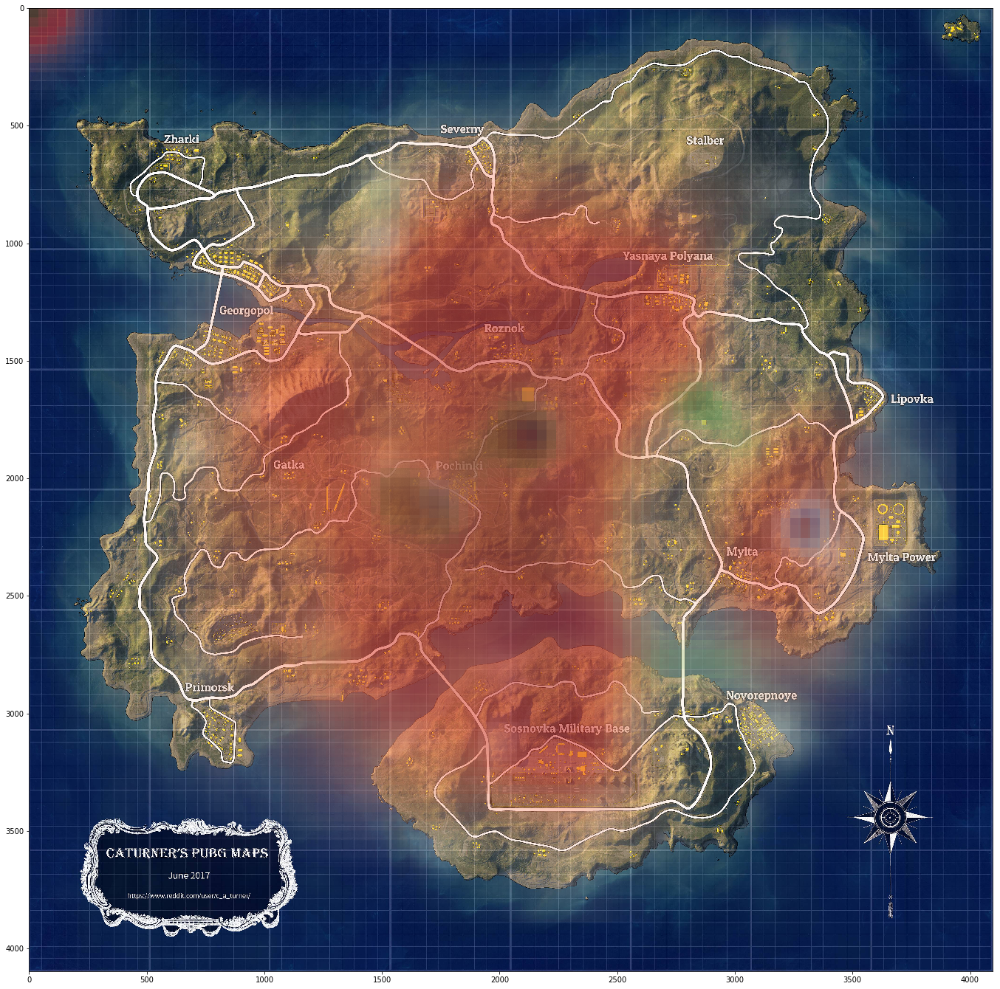

In [27]:
fig, ax = plt.subplots(figsize=(24,24))
ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
ax.imshow(bg)
ax.imshow(c1, extent=e1, origin='lower', cmap=cm.Blues, alpha=0.9)
ax.imshow(c2, extent=e2, origin='lower', cmap=cm.YlGn, alpha=0.7)
ax.imshow(c3, extent=e3, origin='lower', cmap=cm.Reds, alpha=0.5)
ax.invert_yaxis()

plt.savefig('all_3.png')

A few takeaways here:
1. The early game kills are generally in highly urban areas, specifically Pochinki, School, and over by Mylta.
2. Then, the mid game shows areas outside the major urban areas and with more breadth
3. Lastly, the end game is very spread out and this is logical since the players have little control over where the end-game takes place so it is not skewed to any particular city

In [16]:
def plotHist(x, y, sig, bins, alpha, color, alpha_scale):
    heatmap, xedges, yedges = np.histogram2d(x=x, y=y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=sig)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]


    alphas = np.clip(Normalize(0, heatmap.max(), clip=True)(heatmap)*alpha_scale, 0.0, 1.0)
    colors = Normalize(0, heatmap.max(), clip=True)(heatmap)
    if color == 'RED':
        colors = cm.Reds(colors)
    elif color == 'ORANGE':
        colors = cm.Oranges(colors)
    elif color == 'BLUE':
        colors = cm.Blues(colors)
    elif color == 'GREEN':
        colors = cm.Greens(colors)
    elif color == 'YlGn':
        colors = cm.YlGn(colors)
    colors[..., -1] = alphas

    fig, ax = plt.subplots(figsize=(24,24))
    ax.set_xlim(0, 4096); ax.set_ylim(0, 4096)
    ax.imshow(bg)
    if color == 'RED':
        res = ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Reds, alpha=alpha)
    elif color == 'ORANGE':
        res = ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Oranges, alpha=alpha)
    elif color == 'BLUE':
        res = ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Blues, alpha=alpha)
    elif color == 'GREEN':
        res = ax.imshow(colors, extent=extent, origin='lower', cmap=cm.Greens, alpha=alpha)
    elif color == 'YlGn':
        res = ax.imshow(colors, extent=extent, origin='lower', cmap=cm.YlGn, alpha=alpha)
    ax.invert_yaxis()

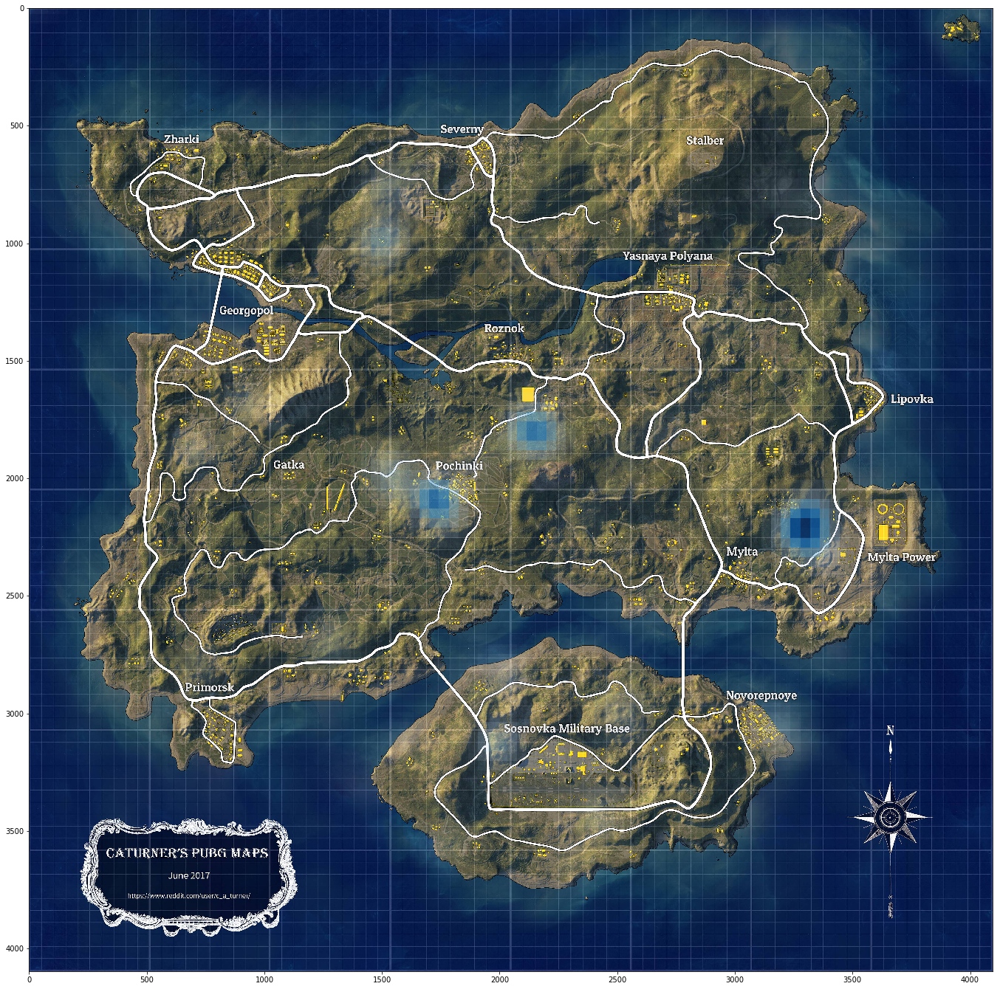

In [23]:
plotHist(x=early_game['killer_position_x'], y=early_game['killer_position_y'], sig=1.5, bins=100,
        alpha=0.8, color='BLUE', alpha_scale=1.5)

plt.savefig('early_game.png')

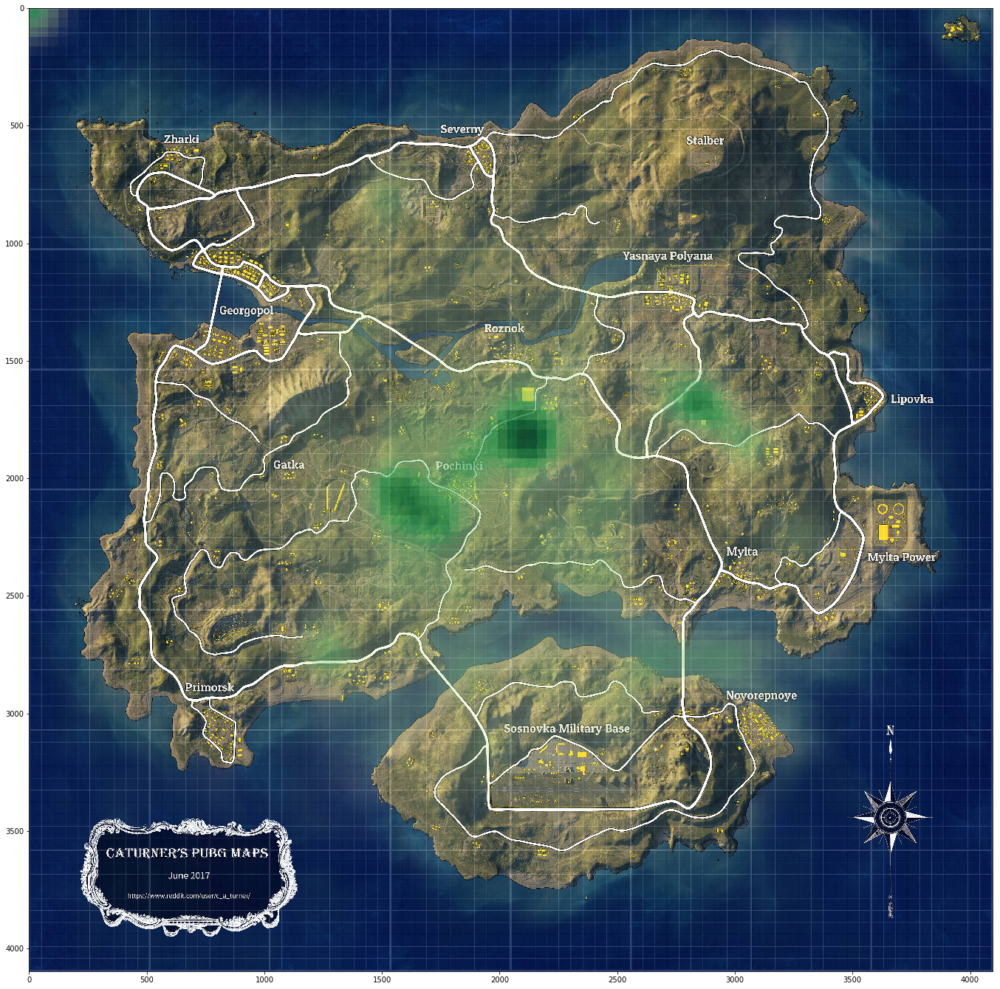

In [24]:
plotHist(x=mid_game['killer_position_x'], y=mid_game['killer_position_y'], sig=2, bins=100,
        alpha=0.8, color='YlGn', alpha_scale=1.5)

plt.savefig('mid_game.png')

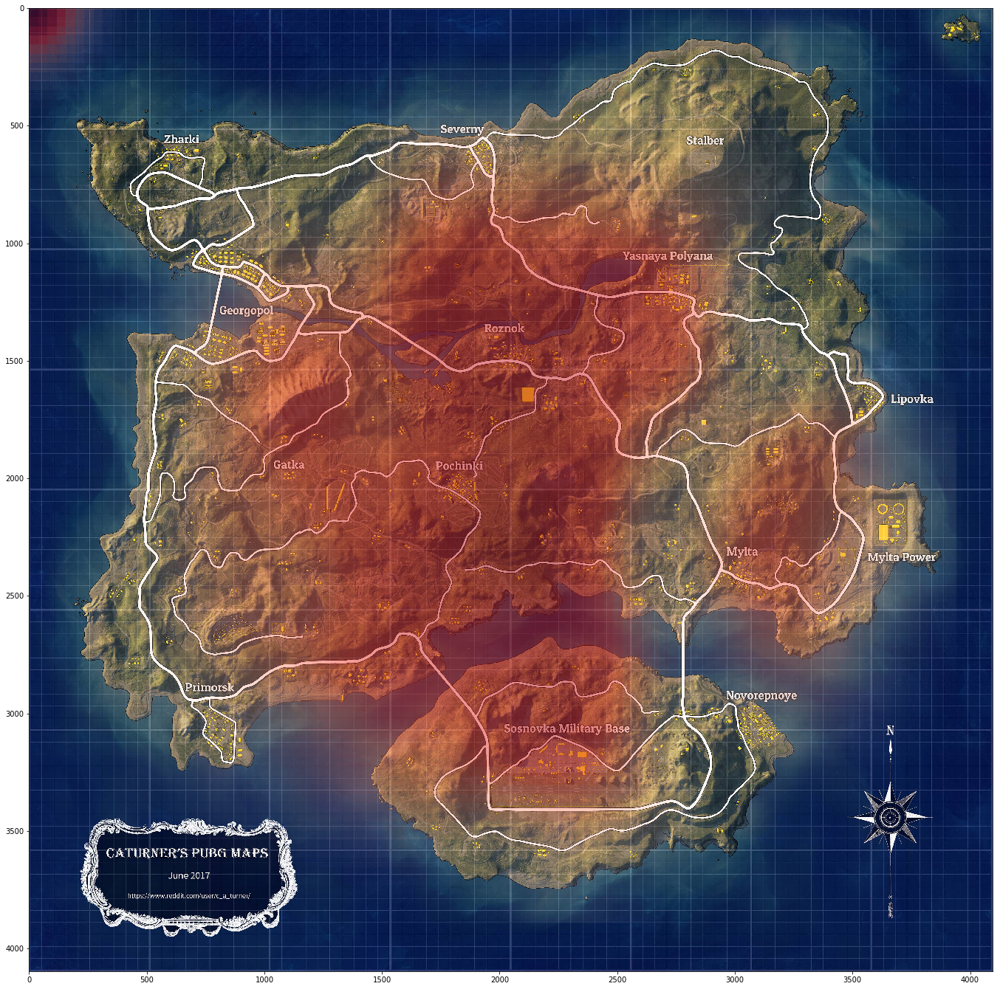

In [25]:
plotHist(x=late_game['killer_position_x'], y=late_game['killer_position_y'], sig=4, bins=100,
        alpha=0.5, color='RED', alpha_scale=1.5)

plt.savefig('late_game.png')